In [1]:
# Import necassary libraries
import os  # used for interacting with the file system
import shutil  # used for managing files and directories in a cross-platform manner
import keras  # used for building deep learning models
import numpy as np  # used for numerical operations on arrays

# Data preprocessing
import tensorflow as tf # used for loading pre-trained models from
from tensorflow.keras.preprocessing.image import ImageDataGenerator # used for image data augmentation

# Data visualization
import seaborn as sns  # used for statistical visualizations
import plotly.graph_objs as go  # used for interactive visualizations
import plotly.express as px # used for interactive visualizations
import matplotlib.pyplot as plt  # used for creating static plots

# Model architecture
from keras import Sequential  # used for building sequential models
from keras.models import load_model  # used for loading pre-trained models
from keras.layers import Dense, GlobalAvgPool2D as GAP, Dropout,MaxPooling2D,BatchNormalization  # used for defining model layers

# Training callbacks 
from keras.callbacks import ModelCheckpoint, EarlyStopping  # for training callbacks

# Pre-trained models
from tensorflow.keras.applications import InceptionV3, Xception, ResNet152V2  # For using pre-trained models

In [2]:
# giving path to the animals10 image dataset from kaggle 
data_path = r"C:\Users\sagar\OneDrive\Desktop\Computer Vision\Dataset"

# Geting a list of all unique class names from the dataset path
class_names = sorted(os.listdir(data_path))

# Counting the number of classes
num_classes = len(class_names)

# Printing the class names and the total number of classes
print("Class Names: \n", class_names)
print("Number of Classes:", num_classes)

Class Names: 
 ['cane', 'cavallo', 'elefante', 'farfalla', 'gallina', 'gatto', 'mucca', 'pecora', 'ragno', 'scoiattolo']
Number of Classes: 10


In [3]:
# Geting the number of samples in each class (number of images per class)
class_sizes = []
for name in class_names:
    class_size = len(os.listdir(data_path + "/" + name))
    class_sizes.append(class_size)
    
# Printing the class distribution
print("Class Distribution:\n", class_sizes)

Class Distribution:
 [4863, 2623, 1446, 2112, 3098, 1668, 1866, 1820, 4821, 1862]


In [4]:
#  converting lists to dictionary
class_name_size = dict(zip(class_names, class_sizes))

In [5]:
# printing dictionary
class_name_size 

{'cane': 4863,
 'cavallo': 2623,
 'elefante': 1446,
 'farfalla': 2112,
 'gallina': 3098,
 'gatto': 1668,
 'mucca': 1866,
 'pecora': 1820,
 'ragno': 4821,
 'scoiattolo': 1862}

In [6]:
# Creating data for the pie chart.
labels = list(class_name_size.keys())
sizes = list(class_name_size.values())


# Defining custom colors for the interactive pie chart.
attractive_colors = ['#e6194b', '#3cb44b', '#ffe119', '#4363d8', '#f58231',
                     '#911eb4', '#46f0f0', '#f032e6', '#bcf60c', '#fabebe']

# Creating the interactive pie chart.
fig = px.pie(
    names=labels,
    values=sizes,
    title='Class Distribution',
    color_discrete_sequence=attractive_colors
)

# formating the layout of the chart to move the legend to the left and centering the title.
fig.update_layout(
    legend=dict(
        orientation="v",
        yanchor="middle",
        y=0.5,
        xanchor="right",
        x=-0.1
    ),
    title={
        'text': 'Class Distribution',
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top',
    }
)

C:\Users\sagar\AppData\Local\Temp\ipykernel_4064\2837688088.py:12: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




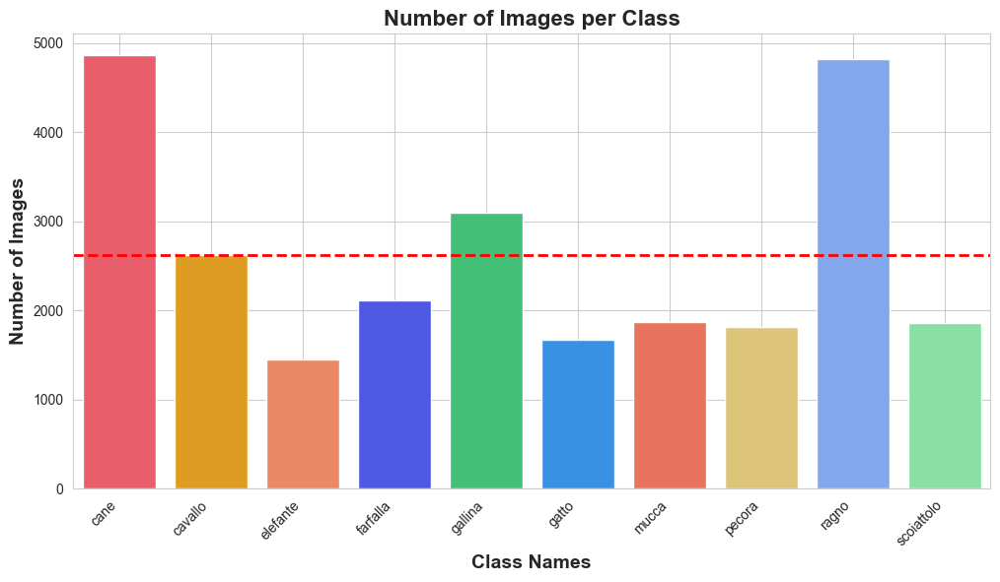

In [7]:
# Custom color palette
custom_palette = ['#ff4757', '#ffa502', '#ff7f50', '#3742fa', '#2ed573', 
                  '#1e90ff', '#ff6348', '#eccc68', '#70a1ff', '#7bed9f']

# Seting the style of seaborn
sns.set_style("whitegrid")

# Sets the size of the figure
plt.figure(figsize=(12,6))

# Ploting a bar chart using the class names as the x-axis and class sizes as the y-axis
sns.barplot(x=class_names, y=class_sizes, palette=custom_palette)

# Adding a grid to the plot for better readability
plt.grid(True)

# Adding a horizontal line to show the mean number of images across all classes
mean_value = np.mean(class_sizes)
plt.axhline(mean_value, color='red', linestyle='--', linewidth=2, label=f"Average: {mean_value:.2f}")

# setting x and y labels
plt.xlabel("Class Names", fontsize=14, weight='bold')
plt.ylabel("Number of Images", fontsize=14, weight='bold')

# preventing overlap
plt.xticks(rotation=45, ha='right')

# Seting the title of the graph
plt.title("Number of Images per Class", fontsize=16, weight='bold')

# printing the plot
plt.show()

In [8]:
# getting minimum class size
np.min(class_sizes)

1446

In [12]:
# handling Data Imbalance

# Seting the path to the directory where the sampled data will be saved
sampled_data_path = r"C:\Users\sagar\OneDrive\Desktop\Computer Vision\SampleData"
# Creating the sampled data directory if it doesn't exist
if not os.path.exists(sampled_data_path):
    os.mkdir(sampled_data_path)

# Seting the percentage of each class to sample
sample_percent = 0.1

# Defining a dictionary that maps the original class names to their English names
class_names_dict = {
    'cane': 'dog',
    'cavallo': 'horse',
    'elefante': 'elephant',
    'farfalla': 'butterfly',
    'gallina': 'chicken',
    'gatto': 'cat',
    'mucca': 'cow',
    'pecora': 'sheep',
    'ragno': 'spider',
    'scoiattolo': 'squirrel'
}

# Looping through each class directory and copy 2000 images or less to the sampled data directory
for class_name in os.listdir(data_path):
    # Geting the path to the original class directory
    class_path = os.path.join(data_path, class_name)
    # Geting the English name of the class
    class_name_en = class_names_dict[class_name]
    # Geting the path to the sampled class directory
    sampled_class_path = os.path.join(sampled_data_path, class_name_en)
    # Creaing the sampled class directory and fill it up only if it doesn't exist ********
    if not os.path.exists(sampled_class_path):
        os.mkdir(sampled_class_path)
        # Geting a list of all the image files in the class directory
        image_files = os.listdir(class_path)
        # Calculating the number of images to sample **************
        image_class_size = class_name_size[class_name]
        if image_class_size > 2000:
            num_images = 2000
        else:
            num_images = int(image_class_size)
        # Samplimg the images
        sampled_images = np.random.choice(image_files, size=num_images, replace=False)
        # Copying the sampled images to the sampled class directory
        for image_name in sampled_images:
            src_path = os.path.join(class_path, image_name)
            dst_path = os.path.join(sampled_class_path, image_name)
            shutil.copyfile(src_path, dst_path)

In [61]:
# Getting the Balanced dataset

sampled_data_path = r"C:\Users\sagar\OneDrive\Desktop\Computer Vision\Dataset\SampleDataset"

# Geting a list of class names from the sampled data directory
class_names = sorted(os.listdir(sampled_data_path))

# Geting the number of samples in each class
class_sizes = []
for name in class_names:
    # Get the number of samples in the class directory
    class_size = len(os.listdir(os.path.join(sampled_data_path, name)))
    class_sizes.append(class_size)
    
# Printing the balanced class distribution
print("Class Distribution:\n", class_sizes)

Class Distribution:
 [2000, 1668, 2000, 1866, 2000, 1446, 2000, 1820, 2000, 1862]


In [62]:
# Creating the pie chart
data = go.Pie(labels=class_names, values=class_sizes)

# Defining the layout and create the figure
layout = go.Layout(title='Balanced Class Distribution')
fig = go.Figure(data=[data], layout=layout)

# printing the figure
fig.show()

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1765: FutureWarning:

unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.



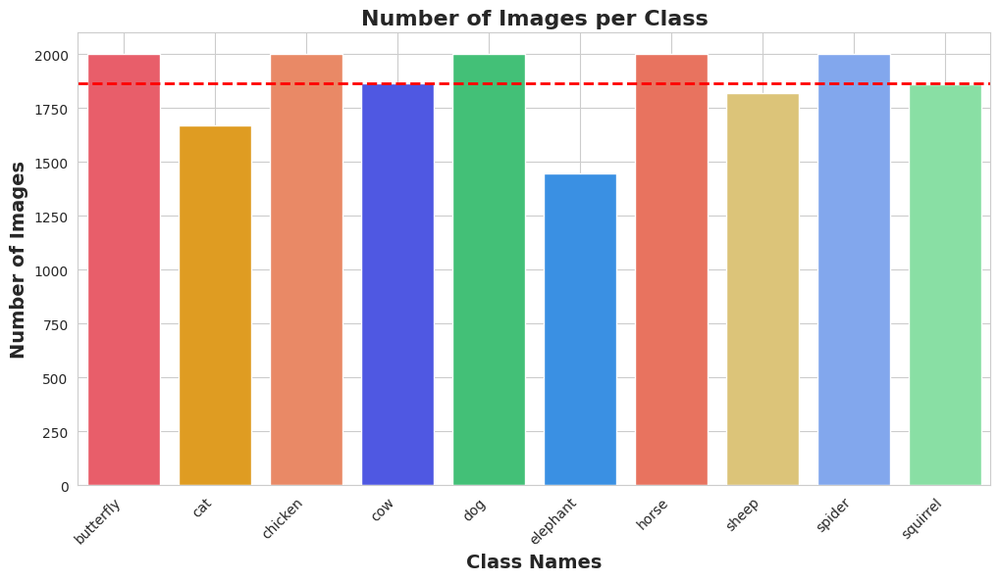

In [63]:
# Custom palette
custom_palette = ['#ff4757', '#ffa502', '#ff7f50', '#3742fa', '#2ed573', 
                  '#1e90ff', '#ff6348', '#eccc68', '#70a1ff', '#7bed9f']

# Seting the style of seaborn
sns.set_style("whitegrid")

# Seting the size of the figure
plt.figure(figsize=(12,6))

# Ploting a bar chart using the class names as the x-axis and class sizes as the y-axis
sns.barplot(x=class_names, y=class_sizes, palette=custom_palette) 

# Adding a grid to the plot for better readability
plt.grid(True)

# Adding a horizontal line to show the mean number of images across all classes
mean_value = np.mean(class_sizes)
plt.axhline(mean_value, color='red', linestyle='--', linewidth=2, label=f"Average: {mean_value:.2f}")

# setting of x and y labels
plt.xlabel("Class Names", fontsize=14, weight='bold')
plt.ylabel("Number of Images", fontsize=14, weight='bold')

# Rotating x labels to prevent overlap
plt.xticks(rotation=45, ha='right')

# Setting the title of the graph
plt.title("Number of Images per Class", fontsize=16, weight='bold')

# printing the plot
plt.show()

In [64]:
# Data Augmentation

data_generator = ImageDataGenerator( # Initializing image data generator with the specified image transformations and preprocessing
    rescale=1./255, # rescale: normalizes pixel values from 0-255 to 0-1
    horizontal_flip=True, # horizontal_flip: randomly flips images horizontally
    vertical_flip=True, # vertical_flip: randomly flips images vertically
    rotation_range=20, # rotation_range: randomly rotates images by a given range in degrees
    validation_split=0.2) # validation_split: splits the data into training and validation sets, with 20% of the data used for validation

train_data = data_generator.flow_from_directory( 
    sampled_data_path, # Load training data from the specified directory and apply the generator
    target_size=(256,256), # target_size: resizes the images to a specified size
    class_mode='binary', # class_mode: specifies the type of label encoding, categorical for multiple classes
    batch_size=32, # batch_size: specifies the number of samples per batch
    shuffle=True, # shuffle: shuffles the data after each epoch
    subset='training')  # subset: specifies the subset of data to load, in this case, the Training set

valid_data = data_generator.flow_from_directory(
    sampled_data_path, # Load validation data from the specified directory and apply the generator
    target_size=(256,256), 
    class_mode='binary', # class_mode: specifies the type of label encoding, categorical for multiple classes
    batch_size=32, 
    shuffle=True, 
    subset='validation') # subset: specifies the subset of data to load validation data

Found 14931 images belonging to 10 classes.
Found 3731 images belonging to 10 classes.


In [65]:
def show_image(image, image_title=None):
    '''
    This function takes in an image and an optional title and plots the image.
    '''
    # Display the image
    plt.imshow(image)
    
    # Set the title of the plot if provided
    plt.title(image_title)
    
    # Turn off the axes in the plot
    plt.axis('off')

In [66]:
def get_random_data(data_tuple):
    """
    Function to get a random data point from a given dataset.

    Args:
    data_tuple (tuple): A tuple containing the dataset images and labels as numpy arrays.

    Returns:
    A random image and its corresponding label as numpy arrays.
    """
    images, labels = data_tuple
    # geting a random index for an image in the dataset
    idx = np.random.randint(len(images))

    # selecting the image and its corresponding label using the random index
    image, label = images[idx], labels[idx]

    # returning the selected image and label
    return image, label

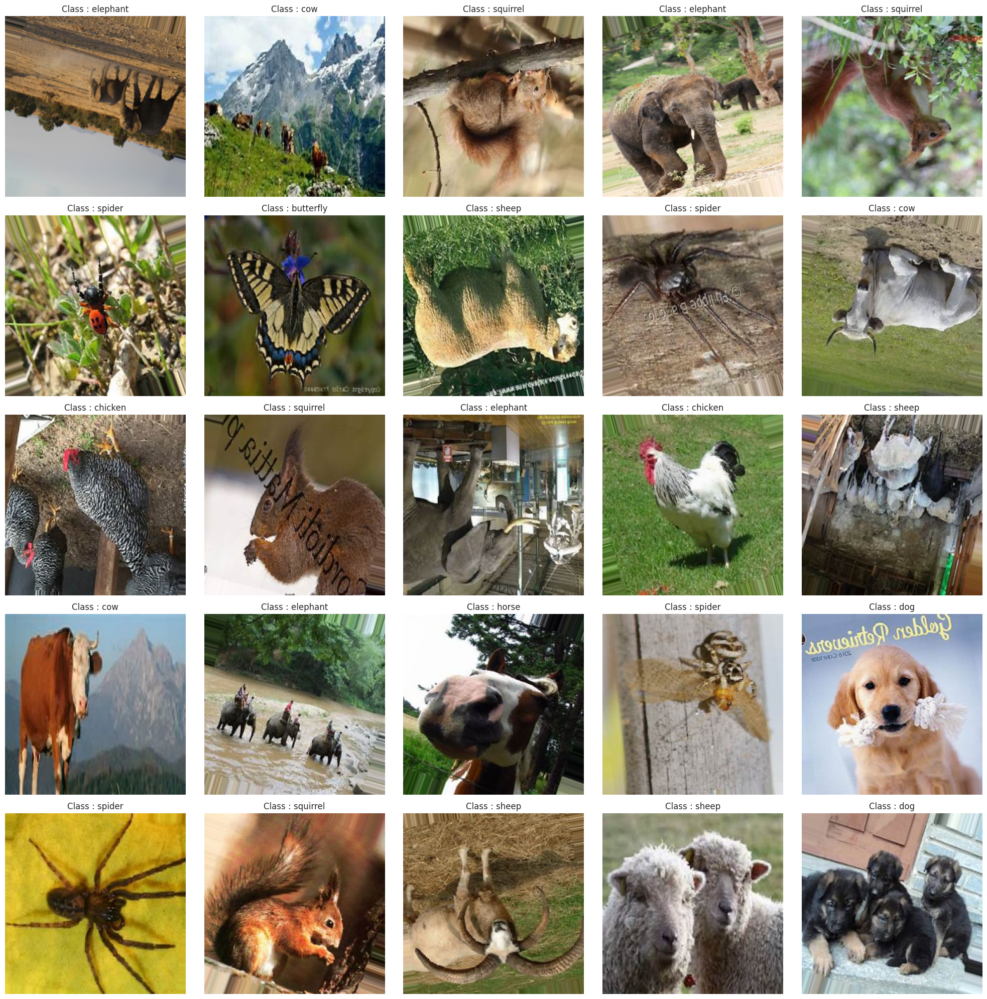

In [67]:
# Setting the figure size for the plot
plt.figure(figsize=(20,20))

# Initializing a counter for the subplots
counter=1

# Looping over the train dataset
for images, labels in iter(train_data):
    
    # Getting a random image and label
    image, label = get_random_data([images, labels])
    
    # Plotting the image with its class name as the title
    plt.subplot(5,5,counter)
    show_image(image, image_title=f"Class : {class_names[int(label)]}")
    
    # Increment the counter
    counter+=1
    
    # End the loop when 25 images have been plotted
    if counter>=26: break

# Adjusting the layout and displaying the plot
plt.tight_layout()
plt.show()

In [68]:
# giving the name of the model as "ResNet152V2".
name = "ResNet152V2"

# Loading the pre-trained ResNet152V2 model, freeze its weights and exclude its final classification layer.
base_model = ResNet152V2(include_top=False, input_shape=(256,256,3), weights='imagenet')
base_model.trainable = False

# Creating a sequential model with the ResNet152V2 base model, a global average pooling layer, two fully connected layers, MaxPooling layer,BatchNormalization layer,and a final softmax classification layer.
resnet152V2 = Sequential([
    base_model, #Adding ResNet152V2 base model
    MaxPooling2D(pool_size=(2, 2)),  # Adding Max Pooling with a 2x2 window
    BatchNormalization(),  # Adding Batch Normalization
    GAP(), # global average pooling layer to reduce dimension and parameters without losing important features
    Dense(256, activation='relu'), #
    Dropout(0.2), # adding droupout layer to prevent overfitting
    Dense(num_classes, activation='softmax')
], name=name)

# Compile the model with sparse categorical cross-entropy as the loss function, Adam optimizer and accuracy as the evaluation metric.
resnet152V2.compile(
    loss='sparse_categorical_crossentropy',
    optimizer='adam',
    metrics=['accuracy']
)

cbs = [
    EarlyStopping(patience=3, restore_best_weights=True),
    ModelCheckpoint(name + ".keras", save_best_only=True)
]

# Train the model using the training and validation datasets, using 50 epochs and the previously defined callbacks.
history = resnet152V2.fit(
    train_data, validation_data=valid_data,
    epochs=50, callbacks=cbs
)

234545216/234545216 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step
Epoch 1/50


/opt/conda/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning:

Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.

I0000 00:00:1709701136.794878     215 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.
W0000 00:00:1709701136.883847     215 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


 19/467 ━━━━━━━━━━━━━━━━━━━━ 10:00 1s/step - accuracy: 0.4556 - loss: 1.6517  

W0000 00:00:1709701161.057459     213 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


467/467 ━━━━━━━━━━━━━━━━━━━━ 0s 538ms/step - accuracy: 0.8261 - loss: 0.5458

W0000 00:00:1709701399.567632     215 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update
W0000 00:00:1709701462.343943     215 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


467/467 ━━━━━━━━━━━━━━━━━━━━ 372s 704ms/step - accuracy: 0.8262 - loss: 0.5455 - val_accuracy: 0.9169 - val_loss: 0.2640
Epoch 2/50
467/467 ━━━━━━━━━━━━━━━━━━━━ 306s 648ms/step - accuracy: 0.9103 - loss: 0.2732 - val_accuracy: 0.9199 - val_loss: 0.2386
Epoch 3/50
467/467 ━━━━━━━━━━━━━━━━━━━━ 301s 637ms/step - accuracy: 0.9232 - loss: 0.2346 - val_accuracy: 0.9239 - val_loss: 0.2482
Epoch 4/50
467/467 ━━━━━━━━━━━━━━━━━━━━ 300s 635ms/step - accuracy: 0.9273 - loss: 0.2221 - val_accuracy: 0.9201 - val_loss: 0.2318
Epoch 5/50
467/467 ━━━━━━━━━━━━━━━━━━━━ 299s 632ms/step - accuracy: 0.9377 - loss: 0.1842 - val_accuracy: 0.9164 - val_loss: 0.2517
Epoch 6/50
467/467 ━━━━━━━━━━━━━━━━━━━━ 298s 630ms/step - accuracy: 0.9367 - loss: 0.1910 - val_accuracy: 0.9266 - val_loss: 0.2411
Epoch 7/50
467/467 ━━━━━━━━━━━━━━━━━━━━ 300s 635ms/step - accuracy: 0.9415 - loss: 0.1712 - val_accuracy: 0.9319 - val_loss: 0.2247
Epoch 8/50
467/467 ━━━━━━━━━━━━━━━━━━━━ 301s 636ms/step - accuracy: 0.9518 - loss: 0.14

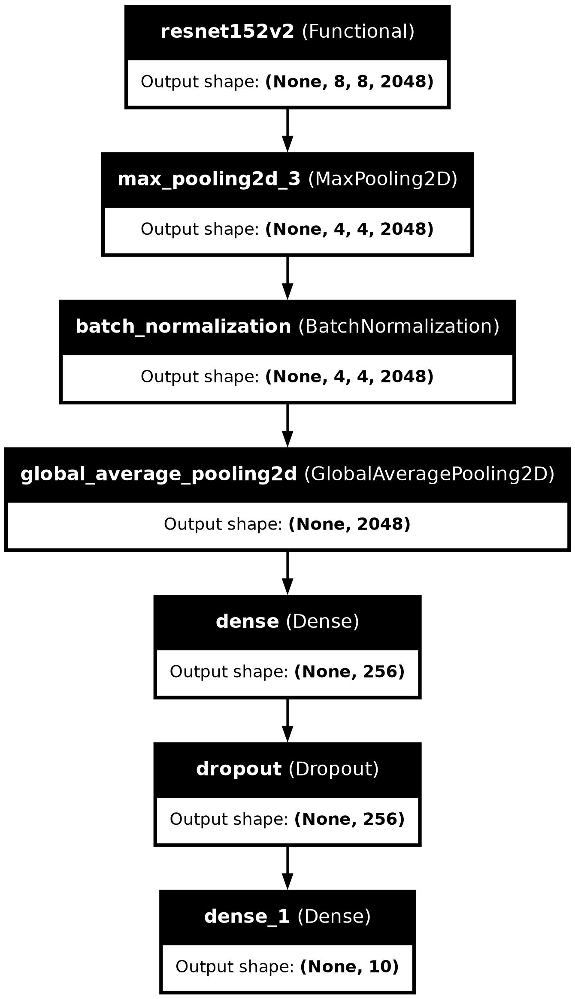

In [69]:
from tensorflow.keras.utils import plot_model

plot_model(resnet152V2, to_file='model_visualization.png', show_shapes=True, show_layer_names=True)

117/117 ━━━━━━━━━━━━━━━━━━━━ 58s 490ms/step - accuracy: 0.9264 - loss: 0.2301
Validation Loss: 0.24597270786762238, Validation Accuracy: 0.9260252118110657
  2/117 ━━━━━━━━━━━━━━━━━━━━ 22s 192ms/step

W0000 00:00:1709704534.450646     215 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


117/117 ━━━━━━━━━━━━━━━━━━━━ 76s 564ms/step


W0000 00:00:1709704599.866005     213 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


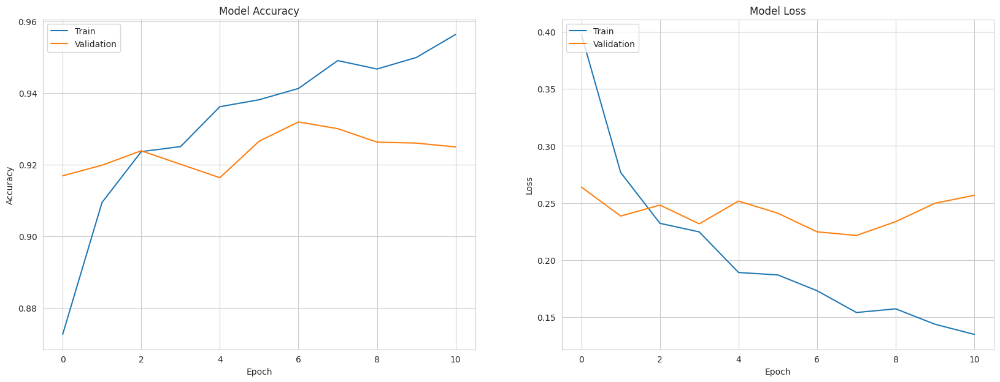

In [70]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, classification_report

# Evaluating the model to get loss and accuracy
val_loss, val_accuracy = resnet152V2.evaluate(valid_data, verbose=1)
print(f'Validation Loss: {val_loss}, Validation Accuracy: {val_accuracy}')

# Predicting on the validation set
predictions = resnet152V2.predict(valid_data)
predicted_classes = np.argmax(predictions, axis=1)
true_classes = valid_data.classes
class_labels = list(valid_data.class_indices.keys())

# Plotting training/validation loss and accuracy for bias-variance analysis
def plot_training_history(history):
    fig, ax = plt.subplots(1, 2, figsize=(20, 7))
    
    # Summarize history for accuracy
    ax[0].plot(history.history['accuracy'])
    ax[0].plot(history.history['val_accuracy'])
    ax[0].set_title('Model Accuracy')
    ax[0].set_ylabel('Accuracy')
    ax[0].set_xlabel('Epoch')
    ax[0].legend(['Train', 'Validation'], loc='upper left')
    
    # Summarize history for loss
    ax[1].plot(history.history['loss'])
    ax[1].plot(history.history['val_loss'])
    ax[1].set_title('Model Loss')
    ax[1].set_ylabel('Loss')
    ax[1].set_xlabel('Epoch')
    ax[1].legend(['Train', 'Validation'], loc='upper left')
    
    plt.show()

plot_training_history(history)

In [71]:
from sklearn.metrics import precision_score, recall_score, f1_score
import numpy as np

# Initializing lists to store true labels and predictions
y_true = []
y_pred = []

# Processing only the first batch from the validation data
for batch in valid_data:  # Iterating through the batches
    inputs, labels = batch
    preds = resnet152V2.predict(inputs)  # Getting model predictions

    # Since it's a multiclass classification, take the argmax to get predicted classes
    preds = np.argmax(preds, axis=-1)

    y_true.extend(labels)  # Collect true labels
    y_pred.extend(preds)  # Collect predictions

    break  # Break after the first batch

# Convert collected true labels and predictions into numpy arrays
y_true = np.array(y_true)
y_pred = np.array(y_pred)

# Calculating Precision, Recall, and F1 Score using 'macro' average for multiclass classification
precision = precision_score(y_true, y_pred, average='macro')
recall = recall_score(y_true, y_pred, average='macro')
f1 = f1_score(y_true, y_pred, average='macro')

print(f"Precision: {precision}")
print(f"Recall: {recall}")
print(f"F1 Score: {f1}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
Precision: 1.0
Recall: 1.0
F1 Score: 1.0


W0000 00:00:1709704610.432449     216 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


In [72]:
from sklearn.metrics import precision_score, recall_score, f1_score
import numpy as np

# Initializing lists to store true labels and predictions
y_true = []
y_pred = []

# Initializing a counter for the number of batches processed
batches_processed = 0

# Iteratimg over the validation data
for batch in valid_data:
    inputs, labels = batch
    preds = resnet152V2.predict(inputs)  # Get model predictions

    # Since it's a multiclass classification, take the argmax to get predicted classes
    preds = np.argmax(preds, axis=-1)

    y_true.extend(labels)  # Collect true labels
    y_pred.extend(preds)  # Collect predictions

    # Incrementing the batch counter
    batches_processed += 1

    # Breaking out of the loop after processing 5 batches
    if batches_processed >= 5:
        break

# Converting collected true labels and predictions into numpy arrays
y_true = np.array(y_true)
y_pred = np.array(y_pred)

# Calculating Precision, Recall, and F1 Score using 'macro' average for multiclass classification
precision = precision_score(y_true, y_pred, average='macro')
recall = recall_score(y_true, y_pred, average='macro')
f1 = f1_score(y_true, y_pred, average='macro')

print(f"Precision: {precision}")
print(f"Recall: {recall}")
print(f"F1 Score: {f1}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
Precision: 0.9021700319804035
Recall: 0.9034805107173529
F1 Score: 0.9017390613081732


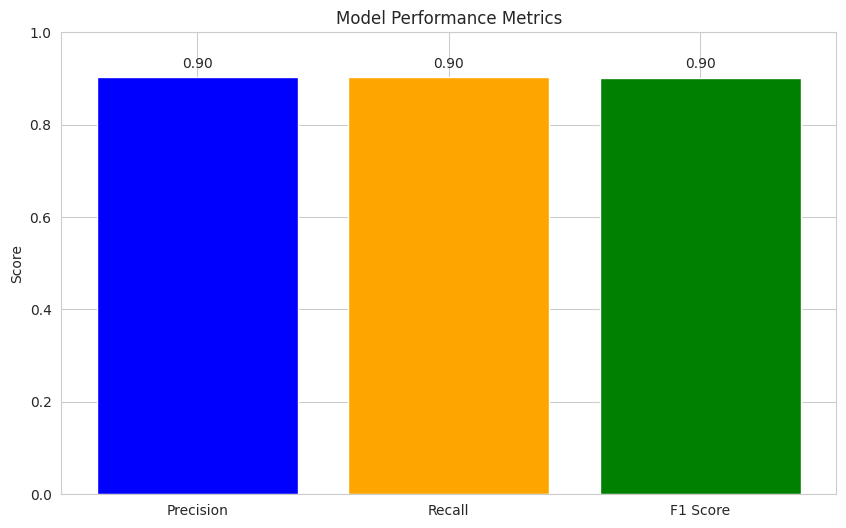

In [73]:
import matplotlib.pyplot as plt

# Metrics
metrics = ['Precision', 'Recall', 'F1 Score']
values = [precision, recall, f1]

# Creating bar chart
plt.figure(figsize=(10, 6))
plt.bar(metrics, values, color=['blue', 'orange', 'green'])

# Adding titles and labels
plt.title('Model Performance Metrics')
plt.ylabel('Score')
plt.ylim(0, 1)  # Since these metrics range from 0 to 1

# Displaying the values on top of the bars
for i, value in enumerate(values):
    plt.text(i, value + 0.02, f"{value:.2f}", ha='center')

# printing the plot
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


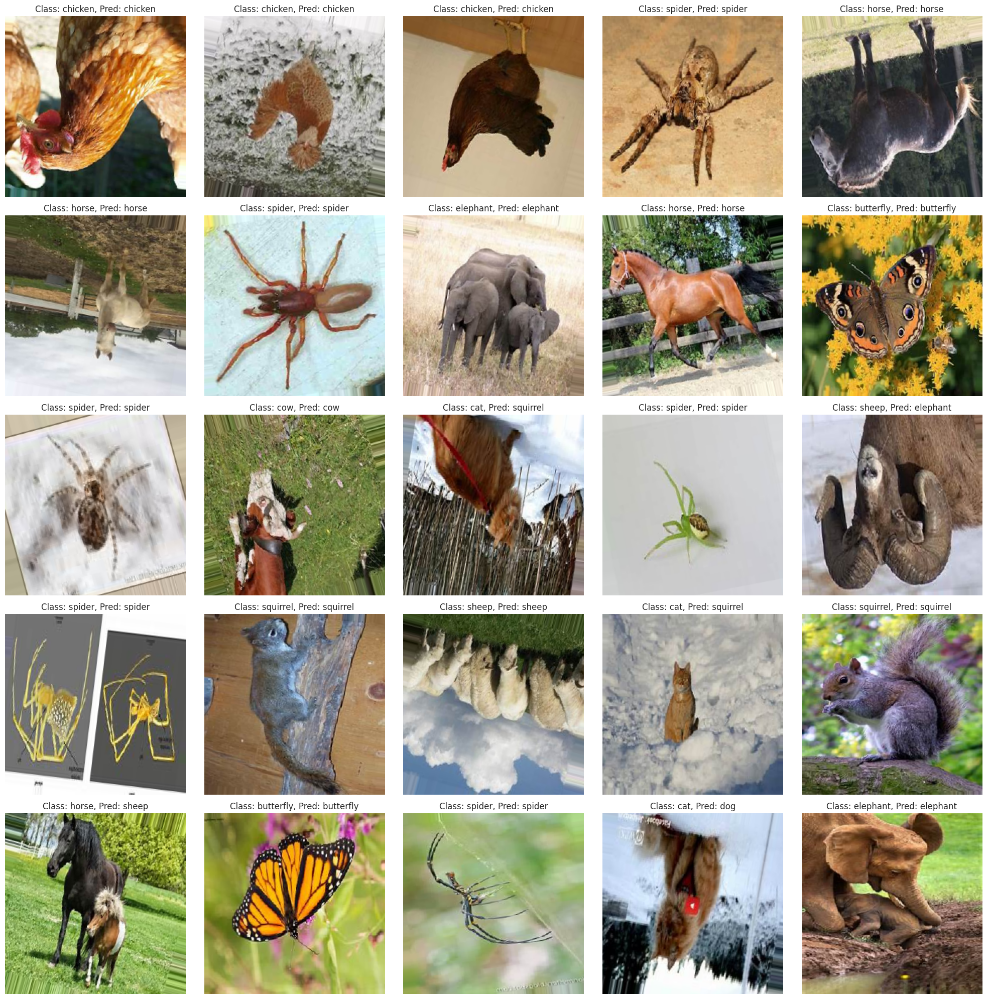

In [89]:
plt.figure(figsize=(20,20))
i=1
for images, labels in iter(valid_data):
    
    # Get Random Image and label
    image, label = get_random_data([images, labels])
    pred_label = class_names[np.argmax(resnet152V2.predict(image[np.newaxis,...]))]
    
    # Plot it
    plt.subplot(5,5,i)
    show_image(image)  # Call show_image without the title parameter
    plt.title(f"Class: {class_names[int(label)]}, Pred: {pred_label}")  # Set the title using plt.title
    
    # Make sure to end the loop
    i += 1
    if i >= 26: 
        break

plt.tight_layout()
plt.show()

***Thank You for being such a nice audience***